# Comparison of baselines in Cifar and CelebAHQ datasets:

Using plotly:

In [1]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go

df = pd.DataFrame({
    "method": ["unet", "tvl1", "nftm_default", "dense_controller", "unet_controller", "nftm_pyramid"],
    "psnr_all↑": [26.7861, 25.5758, 21.4936, 24.7276, 17.8012, 23.97036436539662],
    "ssim_all↑": [0.8807, 0.8770, 0.6989, 0.8138, 0.4663, 0.8841810626319692],
    "lpips_all↓": [0.0113, 0.0124, 0.0272, 0.0109, 0.0670, 0.020741773392014867],
    "fid↓": [17.7756, 20.0207, 90.0137, 45.7054, 158.1003, 9.255786895751953],
    "kid↓": [0.0104, 0.0119, 0.0837, 0.0382, 0.1597, 0.004668102134019136],
})

metrics = ["psnr_all↑", "ssim_all↑", "lpips_all↓", "fid↓", "kid↓"]
x = np.arange(len(metrics))

hover_text = {
    "unet": """UNET:
train_unet.py --epochs 20 --batch_size 256 --lr 0.002 --weight_decay 0.0001 --tv_weight 0.01 --seed 0
--base 10 --target_params 46375 --num_workers 2 --device cuda --benchmark cifar --img_size 32
--save_dir out_cifar32/unet""",

    "tvl1": """TV-L1:
baselines.inpainting.tvl1_baseline --iters 250 --lam 80.0 --tvw 0.1 --tau_p 0.25 --tau_d 0.25 --batch_size 256
--num_workers 2 --seed 0 --save_dir out_cifar32/tvl1""",

    "nftm_default": """NFTM default 20 epochs:
image_inpainting.py --train_dataset cifar --benchmark cifar --img_size 32 --epochs 20
--save_metrics --save_dir out_cifar32/nftm """,

    "dense_controller": """NFTM Dense Controller:
image_inpainting.py --controller dense --epochs 30 --K_train 20 --K_eval 30 --seed 0
 --device cuda --save_metrics --train_dataset cifar --benchmark cifar --img_size 32 --save_dir runs/inpainting/nftm_dense""",

    "unet_controller": """NFTM UNET Controller:
image_inpainting.py --controller unet  --epochs 30 --K_train 20 --K_eval 30 --seed 0
--device cuda --save_metrics --train_dataset cifar --benchmark cifar --img_size 32 --save_dir runs/inpainting/nftm_unet""",

    "nftm_pyramid": """NFTM Pyramid (Dense Controller):
image_inpainting.py --controller dense --save_dir runs/inpainting/nftm_dense --epochs 30 --K_train 20 --K_eval 30
--seed 0 --device cuda --save_metrics --train_dataset cifar --benchmark cifar --img_size 32 --pyramid 16,32 --pyr_steps 3,27"""
}

colors = {
    "unet": "#0077BB",
    "tvl1": "#EE7733",
    "nftm_default": "#009988",
    "dense_controller": "#CC3311",
    "unet_controller": "#EE3377",
    "nftm_pyramid": "#FFD300"   # new color
}

# padding each metric axis
ranges = {}
for m in metrics:
    mn, mx = df[m].min(), df[m].max()
    pad = 0.05 * (mx - mn)
    ranges[m] = (mn - pad, mx + pad)

fig = go.Figure()

for idx, row in df.iterrows():

    # scale each metric to 0–1 using padded ranges
    scaled = []
    for m in metrics:
        lo, hi = ranges[m]
        scaled.append((row[m] - lo) / (hi - lo))

    # Prepare hover text safely (replace newlines)
    ht = hover_text[row["method"]].replace("\n", "<br>")

    fig.add_trace(go.Scatter(
        x=x,
        y=scaled,
        mode="lines+markers",
        line=dict(width=3, color=colors[row["method"]]),
        marker=dict(size=10, color=colors[row["method"]]),
        name=row["method"],
        showlegend=True,
        hovertemplate=(
            f"<b>{row['method']}</b><br><br>"
            f"{ht}"
            "<extra></extra>"
        )
    ))

for i, m in enumerate(metrics):

    lo, hi = ranges[m]
    raw_min, raw_max = df[m].min(), df[m].max()
    ticks = np.linspace(raw_min, raw_max, 5)
    tick_scaled = (ticks - lo) / (hi - lo)

    # Axis line
    fig.add_trace(go.Scatter(
        x=[x[i], x[i]],
        y=[0, 1],
        mode="lines",
        line=dict(color="black", width=2),
        showlegend=False
    ))

    # Axis label
    fig.add_annotation(
        x=x[i],
        y=1.06,
        text=m,
        showarrow=False,
        font=dict(size=14)
    )

    # Tick labels
    for t, ys in zip(ticks, tick_scaled):
        fig.add_annotation(
            x=x[i] - 0.13,
            y=ys,
            text=f"{t:.3f}" if raw_max < 1 else f"{t:.1f}",
            showarrow=False,
            font=dict(size=10)
        )

fig.update_layout(
    height=650,
    title="Comparison models in parallel coordinates-metrics (Cifar Dataset)",
    xaxis=dict(showticklabels=False),
    yaxis=dict(showticklabels=False),
    plot_bgcolor="white",
)

fig.show()


In [3]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go

# =========================
# Updated metrics (from table)
# =========================
df = pd.DataFrame({
    "method": [
        "unet",
        "tvl1",
        "nftm_default",
        "dense_controller",
        "unet_controller",
        "nftm_pyramid",
    ],
    "psnr_all↑": [26.786, 25.576, 21.494, 28.540, 28.019, 23.970],
    "ssim_all↑": [0.8807, 0.8770, 0.6989, 0.9140, 0.9060, 0.8842],
    "lpips_all↓": [0.0113, 0.0124, 0.0272, 0.00644, 0.0075, 0.0207],
    "fid↓": [17.776, 20.021, 90.014, 6.693, 8.070, 9.256],
    "kid↓": [0.0104, 0.0119, 0.0837, 0.0028, 0.00349, 0.0047],
})

metrics = ["psnr_all↑", "ssim_all↑", "lpips_all↓", "fid↓", "kid↓"]
x = np.arange(len(metrics))

# =========================
# Hover text (unchanged)
# =========================
hover_text = {
    "unet": """UNET:
train_unet.py --epochs 20 --batch_size 256 --lr 0.002 --weight_decay 0.0001 --tv_weight 0.01 --seed 0
--base 10 --target_params 46375 --num_workers 2 --device cuda --benchmark cifar --img_size 32
--save_dir out_cifar32/unet""",

    "tvl1": """TV-L1:
baselines.inpainting.tvl1_baseline --iters 250 --lam 80.0 --tvw 0.1 --tau_p 0.25 --tau_d 0.25 --batch_size 256
--num_workers 2 --seed 0 --save_dir out_cifar32/tvl1""",

    "nftm_default": """NFTM default:
image_inpainting.py --train_dataset cifar --benchmark cifar --img_size 32 --epochs 20
--save_metrics --save_dir out_cifar32/nftm""",

    "dense_controller": """NFTM Dense Controller:
image_inpainting.py --controller dense --epochs 30 --K_train 20 --K_eval 30 --seed 0
--device cuda --save_metrics --train_dataset cifar --benchmark cifar --img_size 32
--save_dir runs/inpainting/nftm_dense""",

    "unet_controller": """NFTM UNET Controller:
image_inpainting.py --controller unet --epochs 30 --K_train 20 --K_eval 30 --seed 0
--device cuda --save_metrics --train_dataset cifar --benchmark cifar --img_size 32
--save_dir runs/inpainting/nftm_unet""",

    "nftm_pyramid": """NFTM Pyramid (Dense Controller):
image_inpainting.py --controller dense --epochs 30 --K_train 20 --K_eval 30
--seed 0 --device cuda --save_metrics --train_dataset cifar --benchmark cifar
--img_size 32 --pyramid 16,32 --pyr_steps 3,27"""
}

# =========================
# Colors (unchanged)
# =========================
colors = {
    "unet": "#0077BB",
    "tvl1": "#EE7733",
    "nftm_default": "#009988",
    "dense_controller": "#CC3311",
    "unet_controller": "#EE3377",
    "nftm_pyramid": "#FFD300",
}

# =========================
# Axis ranges with padding
# =========================
ranges = {}
for m in metrics:
    mn, mx = df[m].min(), df[m].max()
    pad = 0.05 * (mx - mn)
    ranges[m] = (mn - pad, mx + pad)

fig = go.Figure()

# =========================
# Model traces
# =========================
for _, row in df.iterrows():

    scaled = [
        (row[m] - ranges[m][0]) / (ranges[m][1] - ranges[m][0])
        for m in metrics
    ]

    ht = hover_text[row["method"]].replace("\n", "<br>")

    fig.add_trace(go.Scatter(
        x=x,
        y=scaled,
        mode="lines+markers",
        line=dict(width=3, color=colors[row["method"]]),
        marker=dict(size=10, color=colors[row["method"]]),
        name=row["method"],
        hovertemplate=f"<b>{row['method']}</b><br><br>{ht}<extra></extra>"
    ))

# =========================
# Custom metric axes
# =========================
for i, m in enumerate(metrics):

    lo, hi = ranges[m]
    raw_min, raw_max = df[m].min(), df[m].max()
    ticks = np.linspace(raw_min, raw_max, 5)
    tick_scaled = (ticks - lo) / (hi - lo)

    fig.add_trace(go.Scatter(
        x=[x[i], x[i]],
        y=[0, 1],
        mode="lines",
        line=dict(color="black", width=2),
        showlegend=False
    ))

    fig.add_annotation(
        x=x[i],
        y=1.06,
        text=m,
        showarrow=False,
        font=dict(size=14)
    )

    for t, ys in zip(ticks, tick_scaled):
        fig.add_annotation(
            x=x[i] - 0.13,
            y=ys,
            text=f"{t:.4f}" if raw_max < 1 else f"{t:.2f}",
            showarrow=False,
            font=dict(size=10)
        )

fig.update_layout(
    height=650,
    title="Comparison of Baseline Models (CIFAR)",
    xaxis=dict(showticklabels=False),
    yaxis=dict(showticklabels=False),
    plot_bgcolor="white",
)

fig.show()


## CELEBAHQ Dataset

In [16]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go

# ============================================================
# UPDATED DATA (ALL METHODS)
# ============================================================

df = pd.DataFrame({
    "method": [
        "unet",
        "tvl1",
        "nftm_20_epochs",
        "dense_controller_30_epochs",
        "unet_controller",
        "nftm_pyramid_30_epochs",
        "nftm_pyramid_10_epochs"
    ],

    "psnr_all↑": [
        27.2716,
        26.6880,
        20.2527,
        16.0266,
        16.7221,
        16.341526761968087,
        25.92609677416213     # NEW
    ],

    "ssim_all↑": [
        0.8685,
        0.9074,
        0.5929,
        0.3147,
        0.3393,
        0.5447626925529317,
        0.9121196067079584     # NEW
    ],

    "lpips_all↓": [
        0.0434,
        0.0335,
        0.2077,
        0.4753,
        0.4427,
        0.2641257558097231,
        0.031126939988833792   # NEW
    ],

    "fid↓": [
        51.1562,
        27.1260,
        98.3346,
        234.9823,
        223.0387,
        132.10549926757812,
        19.25811195373535      # NEW
    ],

    "kid↓": [
        0.0550,
        0.0244,
        0.1079,
        0.2641,
        0.2431,
        0.14502157270908356,
        0.01689308136701584    # NEW
    ],
})

metrics = ["psnr_all↑", "ssim_all↑", "lpips_all↓", "fid↓", "kid↓"]
x = np.arange(len(metrics))

# ============================================================
# HOVER TEXT
# ============================================================

hover_text = {
    "unet": """UNET:
train_unet.py --epochs 20 --batch_size 256 --lr 0.002 --weight_decay 0.0001 --tv_weight 0.01""",

    "tvl1": """TV-L1:
tvl1_baseline --iters 250 --lam 80.0 --tvw 0.1 --tau_p 0.25 --tau_d 0.25""",

    "nftm_20_epochs": """NFTM default 20 epochs:
image_inpainting.py --train_dataset celebahq --epoch 20""",

    "dense_controller_30_epochs": """NFTM Dense Controller:
image_inpainting.py --controller dense --epochs 30 --K_train 20 --K_eval 30 --seed 0
 --device cuda --save_metrics --train_dataset celebahq --benchmark celebahq --img_size 64""",

    "unet_controller": """NFTM UNET Controller:
image_inpainting.py --controller unet --epochs 30 --K_train 20 --K_eval 30 --seed 0
 --device cuda --save_metrics --train_dataset celebahq --benchmark celebahq --img_size 64""",

    "nftm_pyramid_30_epochs": """NFTM Pyramid (Dense Controller):
image_inpainting.py --controller dense --epochs 30 --K_train 20 --K_eval 30
--seed 0 --device cuda --save_metrics --train_dataset celebahq --benchmark celebahq
--img_size 64 --pyramid 16,32,64 --pyr_steps 3,10,17""",

    "nftm_pyramid_10_epochs": """NFTM Pyramid (10 Epochs):
image_inpainting.py --epochs 10 --batch_size 128 -K_train 10 --K_eval 13 
  --benchmark celebahq --train_dataset celebahq 
  --img_size 64 --beta_start 0.28 --beta_max 0.6 --beta_anneal 0.03 --beta_eval_bonus 0.05 
  --corr_clip 0.1 --tv_weight 0.01 --pmin 0.25 --pmax 0.5 --block_prob 0.5 --noise_std 0.3 
  --width 48 --guard_in_train --save_metrics
  --pyramid 16,32,64 --pyr_steps 1,2,10""",
}

colors = {
    "unet": "#0077BB",
    "tvl1": "#EE7733",
    "nftm_20_epochs": "#009988",
    "dense_controller_30_epochs": "#CC3311",
    "unet_controller": "#EE3377",
    "nftm_pyramid_30_epochs": "#FFD300",
    "nftm_pyramid_10_epochs": "#AA8800"
}

# ============================================================
# METRIC RANGES
# ============================================================

ranges = {}
for m in metrics:
    mn, mx = df[m].min(), df[m].max()
    pad = 0.05 * (mx - mn) if mx != mn else 0.01
    ranges[m] = (mn - pad, mx + pad)

fig = go.Figure()

# ============================================================
# ADD LINES FOR EACH METHOD
# ============================================================

for idx, row in df.iterrows():

    scaled = []
    for m in metrics:
        lo, hi = ranges[m]
        scaled.append((row[m] - lo) / (hi - lo))

    ht = hover_text[row["method"]].replace("\n", "<br>")

    fig.add_trace(go.Scatter(
        x=x,
        y=scaled,
        mode="lines+markers",
        line=dict(width=3, color=colors[row["method"]]),
        marker=dict(size=10, color=colors[row["method"]]),
        name=row["method"],
        hovertemplate=(
            f"<b>{row['method']}</b><br><br>"
            f"{ht}<extra></extra>"
        )
    ))

# ============================================================
# DRAW AXES FOR EACH METRIC
# ============================================================

for i, m in enumerate(metrics):

    lo, hi = ranges[m]
    raw_min, raw_max = df[m].min(), df[m].max()
    ticks = np.linspace(raw_min, raw_max, 5)
    tick_scaled = (ticks - lo) / (hi - lo)

    fig.add_trace(go.Scatter(
        x=[x[i], x[i]],
        y=[0, 1],
        mode="lines",
        line=dict(color="black", width=2),
        showlegend=False
    ))

    fig.add_annotation(
        x=x[i],
        y=1.06,
        text=m,
        showarrow=False,
        font=dict(size=14)
    )

    for t, ys in zip(ticks, tick_scaled):
        fig.add_annotation(
            x=x[i] - 0.13,
            y=ys,
            text=f"{t:.3f}" if raw_max < 1 else f"{t:.2f}",
            showarrow=False,
            font=dict(size=10)
        )

fig.update_layout(
    height=650,
    title="Interactive Parallel Coordinates (All Methods + Controllers + Pyramid + 10 Epochs)",
    xaxis=dict(showticklabels=False),
    yaxis=dict(showticklabels=False),
    plot_bgcolor="white",
)

fig.show()


In [5]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go

# ============================================================
# UPDATED DATA (FROM TABLE)
# ============================================================

df = pd.DataFrame({
    "method": [
        "unet",
        "tvl1",
        "default_dense_20_epochs",
        "dense_controller_30_epochs",
        "unet_controller_50_epochs",
        "nftm_pyramid_30_epochs",
        "nftm_pyramid_10_epochs",
    ],

    "psnr_all↑": [
        27.272,
        26.688,
        20.253,
        29.342,
        30.002,
        16.342,
        25.926,
    ],

    "ssim_all↑": [
        0.8685,
        0.9074,
        0.5929,
        0.9320,
        0.9389,
        0.5448,
        0.9121,
    ],

    "lpips_all↓": [
        0.0434,
        0.0335,
        0.2077,
        0.01525,
        0.0151,
        0.2641,
        0.0311,
    ],

    "fid↓": [
        51.156,
        27.126,
        98.335,
        7.5706,
        9.589,
        132.105,
        19.258,
    ],

    "kid↓": [
        0.0550,
        0.0244,
        0.1079,
        0.00624,
        0.0085,
        0.1450,
        0.0169,
    ],
})

metrics = ["psnr_all↑", "ssim_all↑", "lpips_all↓", "fid↓", "kid↓"]
x = np.arange(len(metrics))

# ============================================================
# HOVER TEXT (unchanged semantics)
# ============================================================

hover_text = {
    "unet": "UNET baseline (20 epochs)",
    "tvl1": "TV-L1 classical optimization baseline",
    "default_dense_20_epochs": "NFTM default dense controller (20 epochs)",
    "dense_controller_30_epochs": "NFTM dense controller (30 epochs)",
    "unet_controller_50_epochs": "NFTM UNet controller (50 epochs)",
    "nftm_pyramid_30_epochs": "NFTM pyramid schedule (30 epochs)",
    "nftm_pyramid_10_epochs": "NFTM pyramid schedule (10 epochs)",
}

colors = {
    "unet": "#0077BB",
    "tvl1": "#EE7733",
    "default_dense_20_epochs": "#009988",
    "dense_controller_30_epochs": "#CC3311",
    "unet_controller_50_epochs": "#AA3377",
    "nftm_pyramid_30_epochs": "#FFD300",
    "nftm_pyramid_10_epochs": "#AA8800",
}

# ============================================================
# METRIC RANGES (PADDED)
# ============================================================

ranges = {}
for m in metrics:
    mn, mx = df[m].min(), df[m].max()
    pad = 0.05 * (mx - mn)
    ranges[m] = (mn - pad, mx + pad)

fig = go.Figure()

# ============================================================
# MODEL TRACES
# ============================================================

for _, row in df.iterrows():

    scaled = [
        (row[m] - ranges[m][0]) / (ranges[m][1] - ranges[m][0])
        for m in metrics
    ]

    fig.add_trace(go.Scatter(
        x=x,
        y=scaled,
        mode="lines+markers",
        line=dict(width=3, color=colors[row["method"]]),
        marker=dict(size=10),
        name=row["method"],
        hovertemplate=(
            f"<b>{row['method']}</b><br>"
            f"{hover_text[row['method']]}<extra></extra>"
        ),
    ))

# ============================================================
# DRAW AXES PER METRIC
# ============================================================

for i, m in enumerate(metrics):

    lo, hi = ranges[m]
    raw_min, raw_max = df[m].min(), df[m].max()
    ticks = np.linspace(raw_min, raw_max, 5)
    tick_scaled = (ticks - lo) / (hi - lo)

    fig.add_trace(go.Scatter(
        x=[x[i], x[i]],
        y=[0, 1],
        mode="lines",
        line=dict(color="black", width=2),
        showlegend=False,
    ))

    fig.add_annotation(
        x=x[i],
        y=1.06,
        text=m,
        showarrow=False,
        font=dict(size=14),
    )

    for t, ys in zip(ticks, tick_scaled):
        fig.add_annotation(
            x=x[i] - 0.13,
            y=ys,
            text=f"{t:.4f}" if raw_max < 1 else f"{t:.2f}",
            showarrow=False,
            font=dict(size=10),
        )

fig.update_layout(
    height=650,
    title="Comparison baselines - CelebA-HQ",
    xaxis=dict(showticklabels=False),
    yaxis=dict(showticklabels=False),
    plot_bgcolor="white",
)

fig.show()


### Let's see what is going in each
## Unet
Has best PSRN

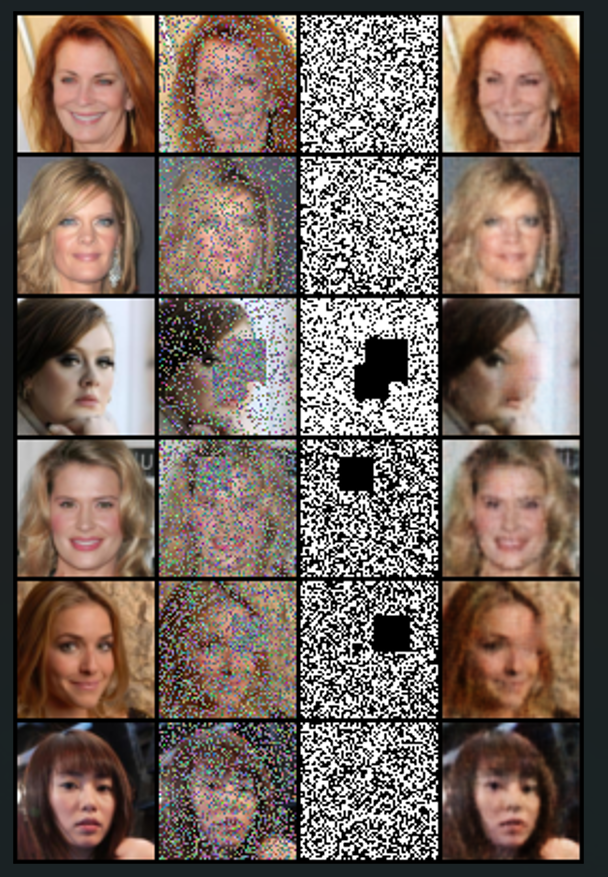

## TVL1
Has best ssim

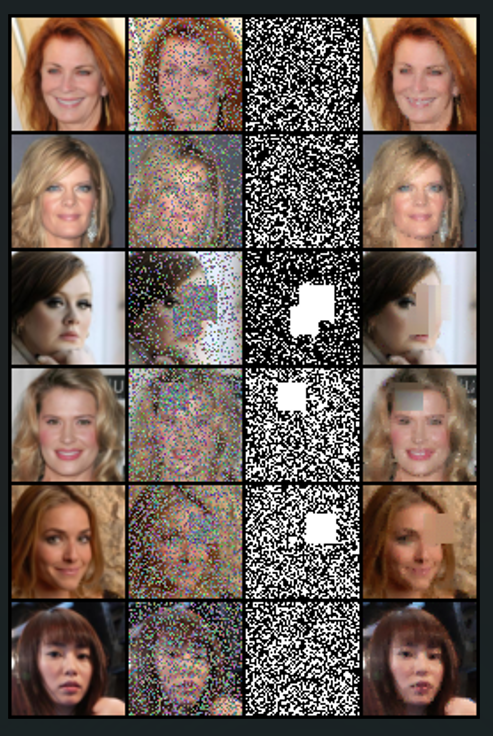

## NFTM DEFAULT: epochs: 20, K_train: 8, K_eval: 12

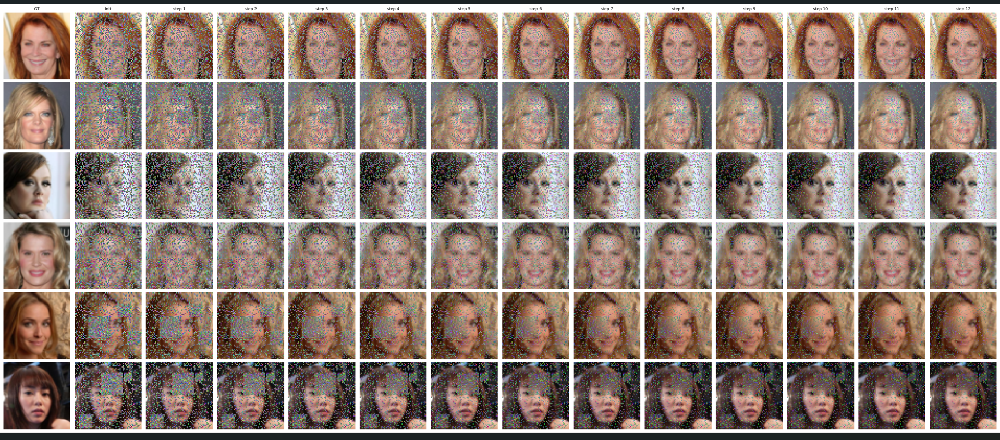

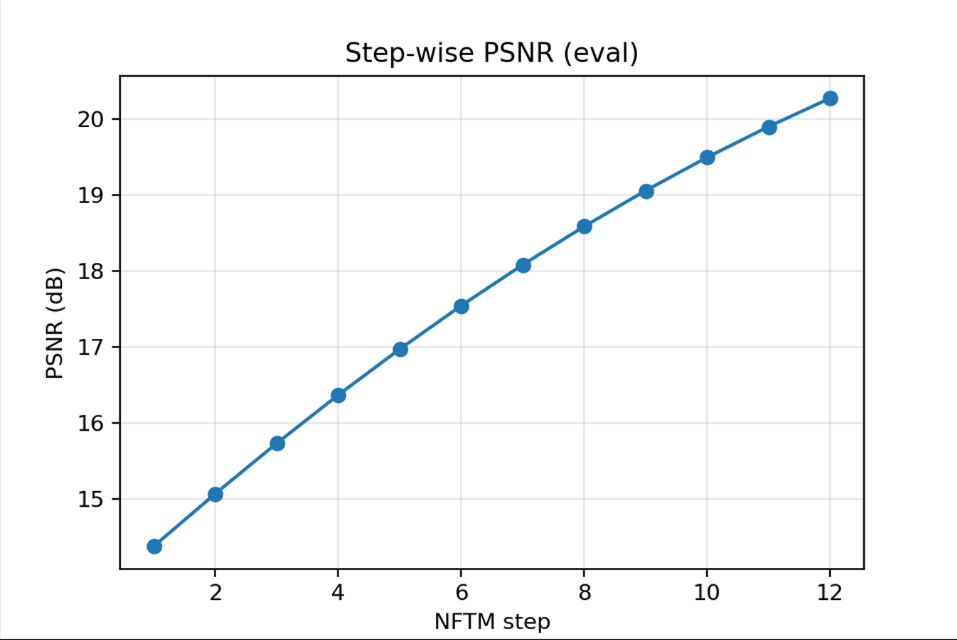

## NFTM Dense
Epochs:30, K_train: 20, K_eval: 30

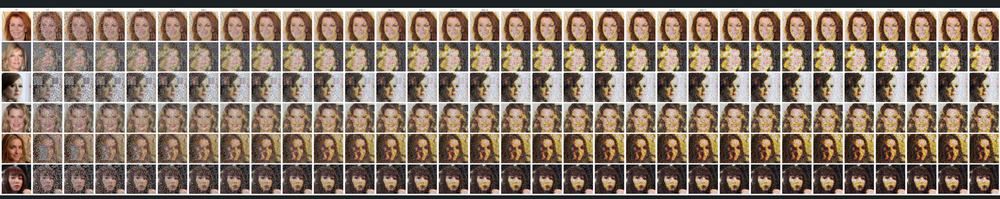

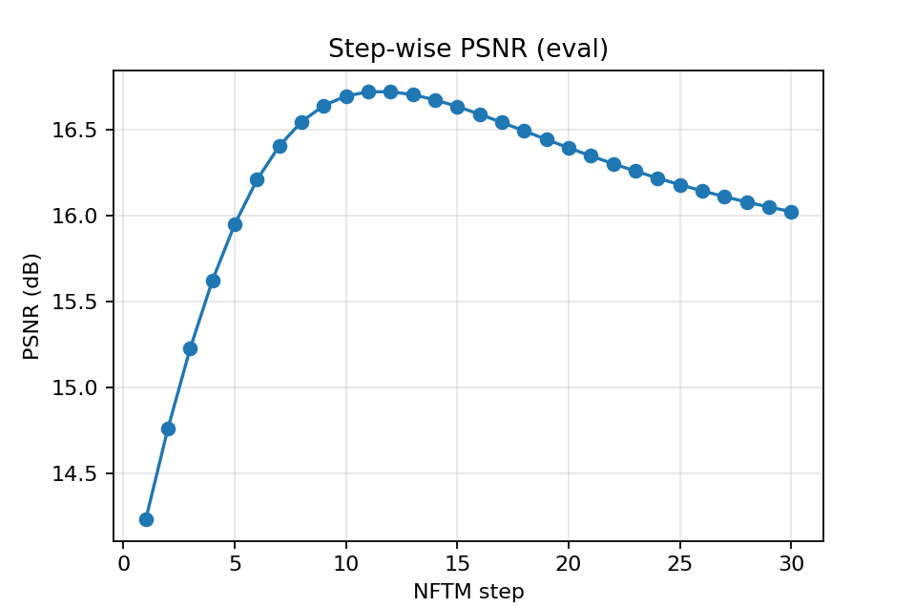

## NFTM UNET Controller
Epochs:30, K_train: 20, K_eval: 30

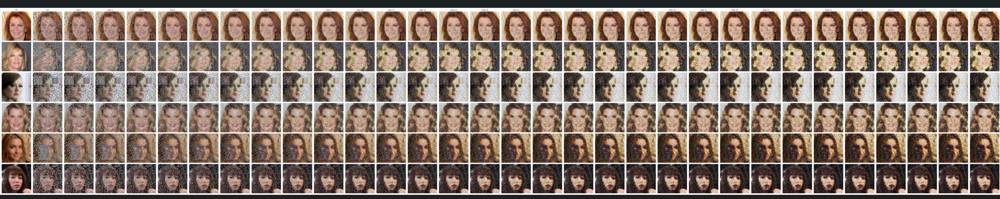

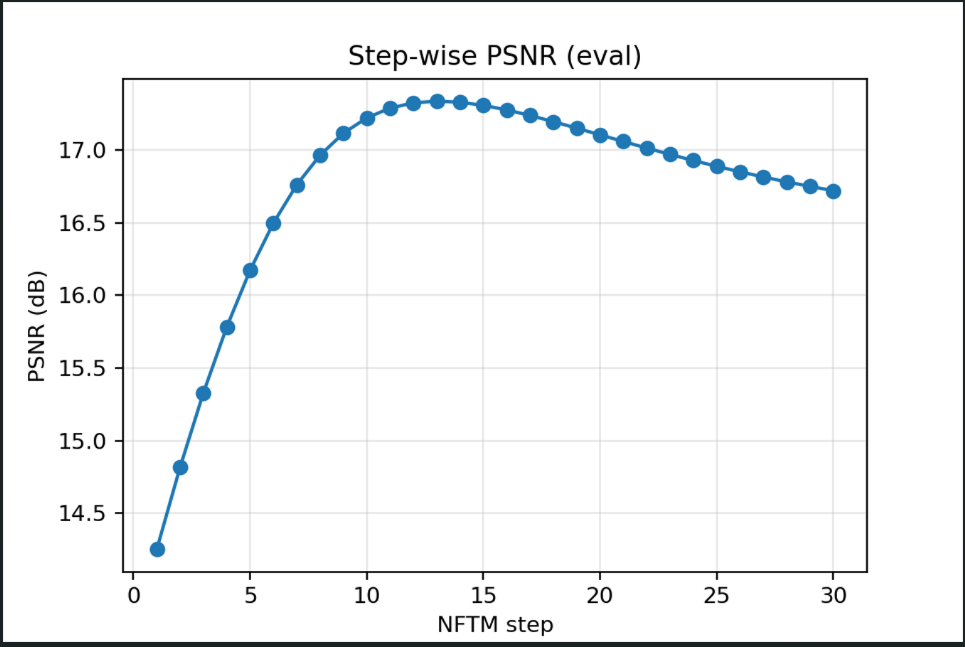

## Pyramid 30 epochs

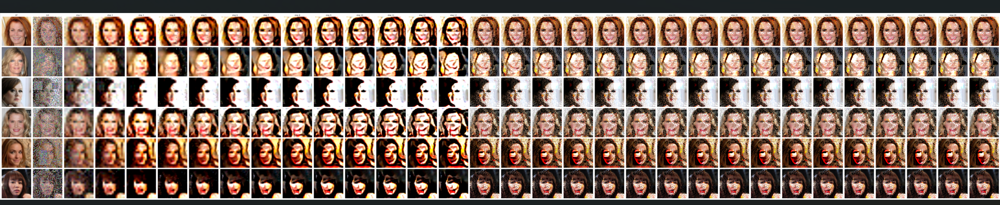

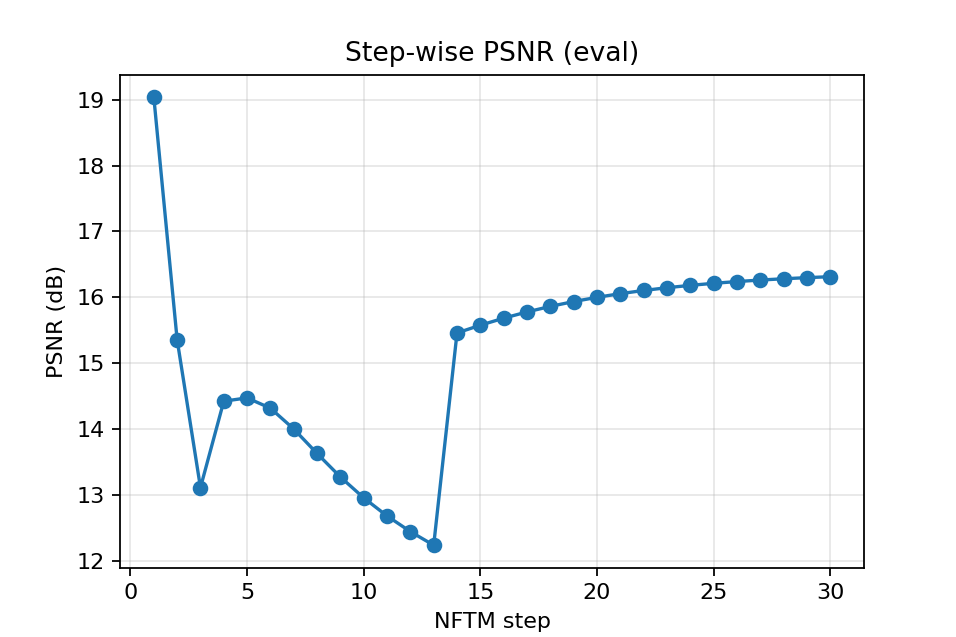

## Other experiments
The next experiments were also run that can help us with the conclusions:

## Pyramid 10 epochs
"epochs": 10, "K_train": 10, "K_eval": 13

`python3 image_inpainting.py \
  --epochs 10 --batch_size 128 \
  --K_train 10 --K_eval 13 \
  --benchmark celebahq --train_dataset celebahq \
  --img_size 64 \
  --beta_start 0.28 --beta_max 0.6 --beta_anneal 0.03 --beta_eval_bonus 0.05 \
  --corr_clip 0.1 --tv_weight 0.01 \
  --pmin 0.25 --pmax 0.5 --block_prob 0.5 --noise_std 0.3 \
  --width 48 --guard_in_train --save_metrics \
  --pyramid 16,32,64 --pyr_steps 1,2,10 \
  --save_dir runs/train_guarded_pyr16_32_64`

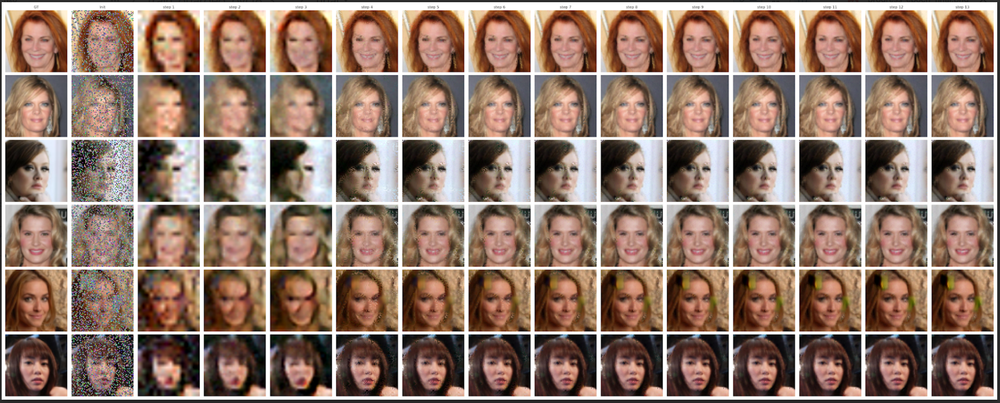

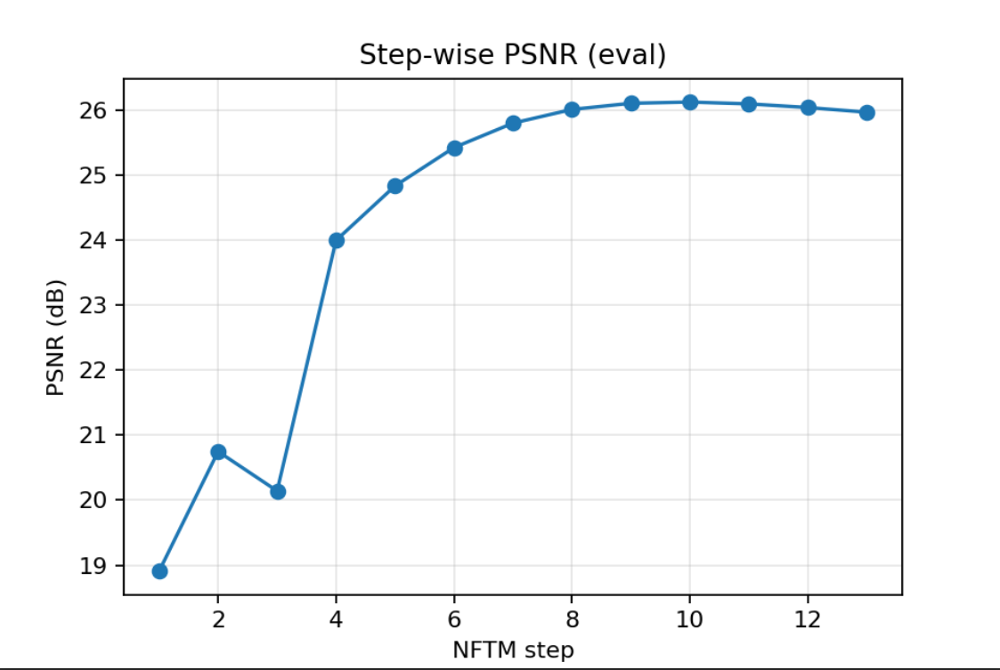